In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio import plot #essential to plot images in BNG, in correct posiiton, and full RGB 
import matplotlib.pyplot as plt
from rasterio.mask import mask

import shapely as shp
from shapely.ops import linemerge

import earthpy as et 
#import earthpy.spatial as es 
import earthpy.plot as ep #to plot np array of RGB pixel numbers
#import cartopy as cp

pd.set_option('display.max_column', 100) #set max number of cols to display before ...
%matplotlib inline

In [2]:
M20Area_GP = gpd.read_file(r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\JigsawRGB\M20Area_PG.shp")

In [3]:
M20Area_GP.nunique()

OBJECTID      3838
TOID          3838
FeatureCod       2
Version         10
VersionDat      63
Theme            1
ThemeCount       1
Calculated    3834
ChangeDate      86
ReasonForC       6
ChangeHist       9
Descriptiv       1
Descript_1       1
Descript_2       2
Descript_3       2
Make             3
PhysicalLe       1
PhysicalPr       0
style_code       3
BHATopoAre       0
BHAProcess       0
AbsHMin          0
AbsH2            0
AbsHMax          0
RelH2            0
RelHMax          0
BHAConf          0
Shape_Leng    3836
Shape_Area    3828
condition_       1
geometry      3838
dtype: int64

In [79]:
m20AP_path = r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Raster\M201AB\120412_20230807\25cm Aerial Photo\120412-2_RGB\SJ8493.tif"
rgb = rasterio.open(m20AP_path)
print("path: ", rgb.name, "\nmode: ", rgb.mode, "\nis closed?: ", rgb.closed
      , "\nband count: ", rgb.count, "\nshape: ", rgb.shape, "\nprofile: ", rgb.profile)


path:  C:/Users/Inateck/Documents/parking_provision/off_street_parking/Raster/M201AB/120412_20230807/25cm Aerial Photo/120412-2_RGB/SJ8493.tif 
mode:  r 
is closed?:  False 
band count:  3 
shape:  (4000, 4000) 
profile:  {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 3, 'crs': CRS.from_wkt('PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.324975315035,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4277"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.9996012717],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","27700"]]'), 'transform': Affine(0.2

<Axes: >

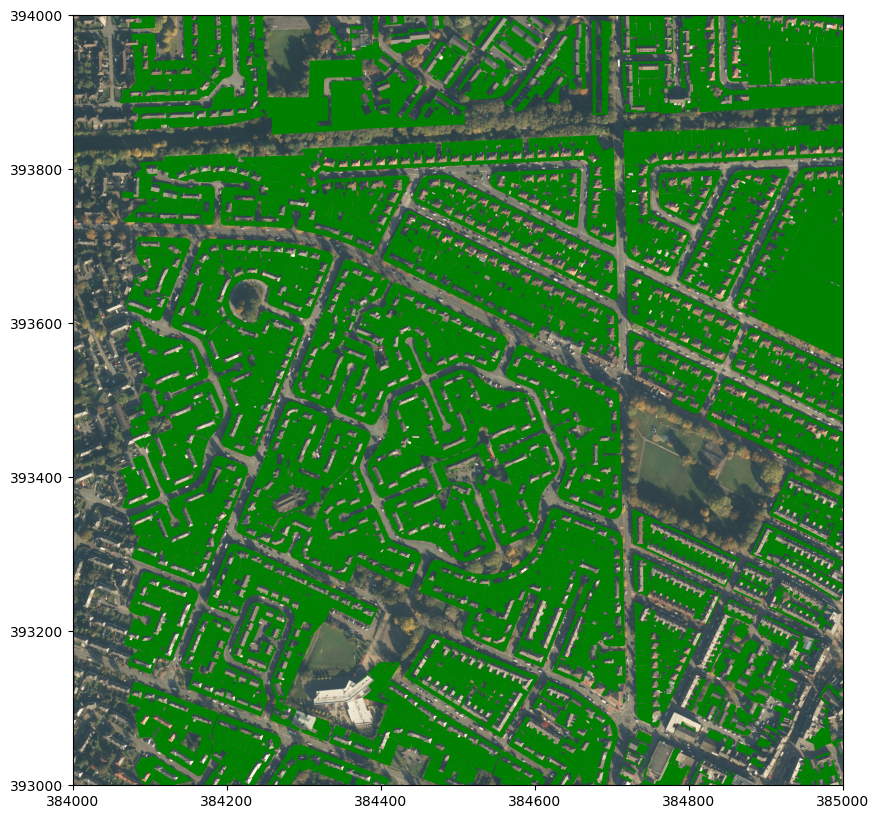

In [8]:
base = M20Area_GP.query("condition_ == '1'").plot(figsize=(10,10),color = 'green')
plot.show(rgb, ax = base) #uses rasterio plot module

## Jigsaw Test

<Axes: >

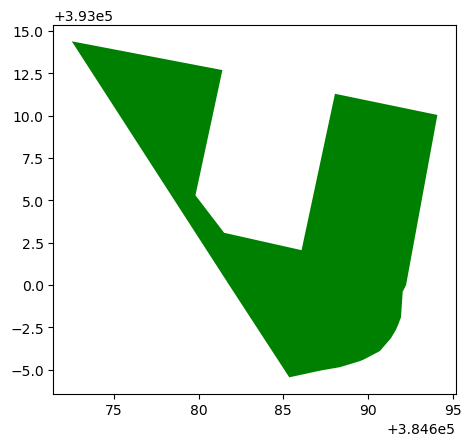

In [9]:
#create gdf of a single garden vector polygon
gdn1 = M20Area_GP.query('TOID == "osgb1000000254165546"')
gdn1.plot(color = 'green')

In [12]:
im1, im1_trans = mask(dataset = rgb #open raster tif file
                    , shapes = gdn1.geometry #shapley polygon geometry column of gdf
                    , crop = True #crop to North and East extent of image
                    , all_touched = True #include a pixel if it touches any of the shapes
                    , nodata = 255 #set nodata value for all RGB layers, 255 = white, 0 = black
                    , filled = True
                    
                   )

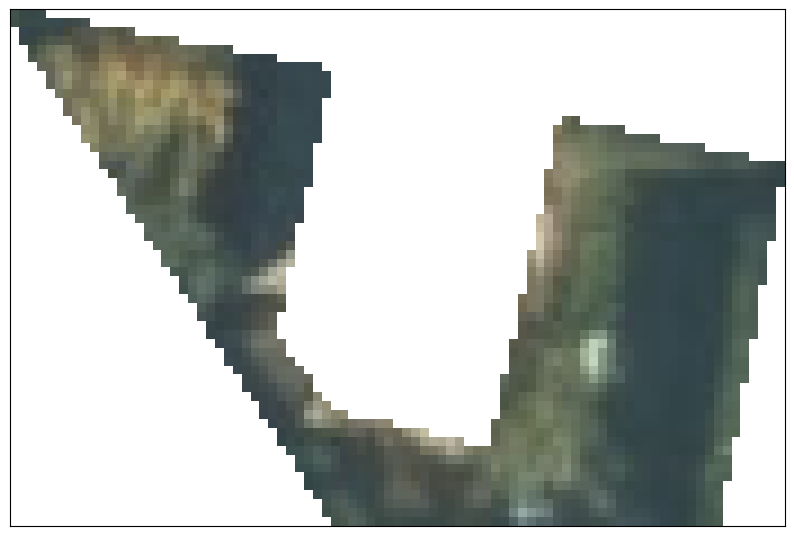

<Axes: >

In [13]:
ep.plot_rgb(im1)

In [10]:
def jigsaw(raster, gdf):
    
    #set meta data
    im_meta = raster.meta
    
    for i in np.arange(gdf.shape[0]):
        
        g = gdf.copy(deep=True).iloc[i:i+1] #create single row gdf from gdf of all polygons
        
        #use rasterio.mask.mask from rasterio.mask import mask must be run
        #im: raster np array, im_transform: transform 
        im, im_transform = mask(dataset = raster
                                , shapes = g.geometry #assumes geometry column is named geometry
                                , crop = True #crop to North and East extent of image
                                , all_touched = True #include a pixel if it touches any of the shapes
                                , nodata = 255 #set nodata value for all RGB layers, 255 = white, 0 = black
                                , filled = True 
                               )
        #update meta data
        im_meta.update({"driver": "GTiff"
                        , "height": im.shape[1]
                        ,"width": im.shape[2]
                        ,"transform": im_transform})
        
        #create filename
        filename = r"C:/Users/Inateck/Documents/parking_provision/off_street_parking/Jigsaw/" + grid + "_" + g.TOID.iloc[0] + ".tif"
        
        #write to tif
        with rasterio.open(filename, mode = "w", **im_meta) as dest:
            dest.write(im)

In [32]:
grid = 'm20'
jigsaw(raster = src, gdf = M20Area_GP)

## NIR Jigsaw

In [14]:
m20APNIR_path = r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Raster\M201AB\120412_20230807\50cm Colour Infrared\120412-3_CIR\SJ8493.tif"
nir = rasterio.open(m20APNIR_path)
print("path: ", nir.name, "\nmode: ", nir.mode, "\nis closed?: ", nir.closed
      , "\nband count: ", nir.count, "\nshape: ", nir.shape, "\nprofile: ", nir.profile)


path:  C:/Users/Inateck/Documents/parking_provision/off_street_parking/Raster/M201AB/120412_20230807/50cm Colour Infrared/120412-3_CIR/SJ8493.tif 
mode:  r 
is closed?:  False 
band count:  3 
shape:  (2000, 2000) 
profile:  {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 2000, 'height': 2000, 'count': 3, 'crs': CRS.from_wkt('PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.324975315035,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4277"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.9996012717],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","27700"]]'), 'transform': Affine(

<Axes: >

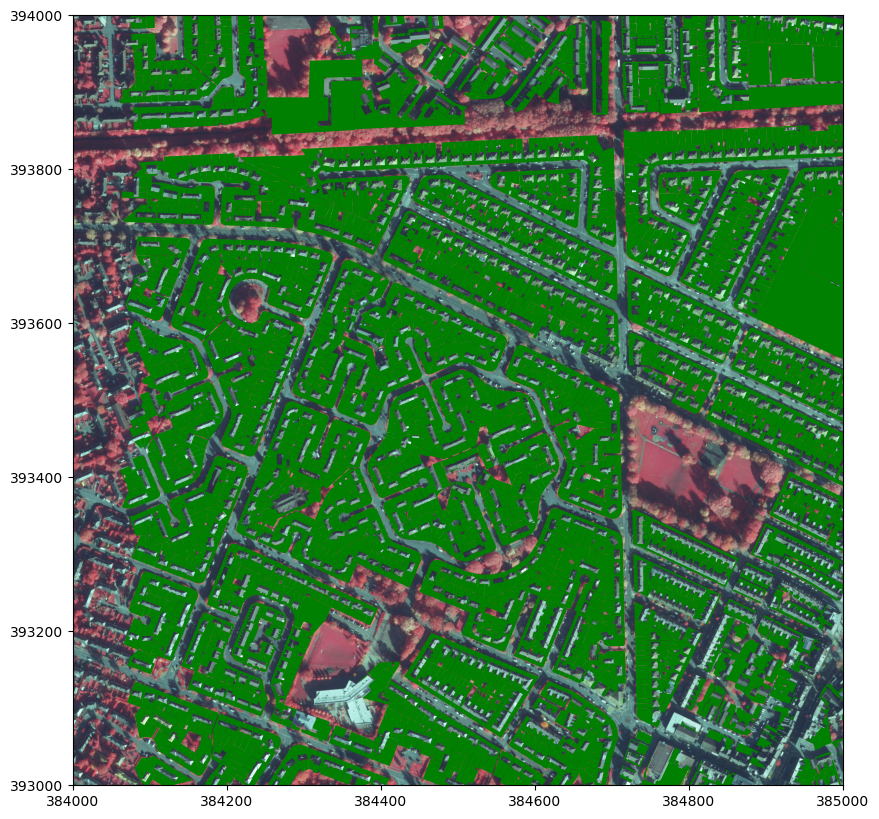

In [15]:
base = M20Area_GP.query("condition_ == '1'").plot(figsize=(10,10),color = 'green')
plot.show(nir, ax = base) #uses rasterio plot module

In [16]:
im1, im1_trans = mask(dataset = nir #open raster tif file
                    , shapes = gdn1.geometry #shapley polygon geometry column of gdf
                    , crop = True #crop to North and East extent of image
                    , all_touched = True #include a pixel if it touches any of the shapes
                    , nodata = 255 #set nodata value for all RGB layers, 255 = white, 0 = black
                    , filled = True
                    
                   )

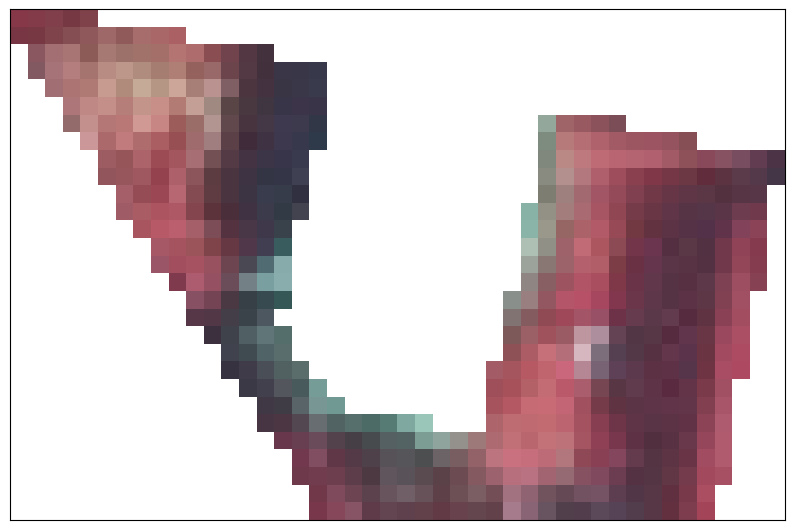

<Axes: >

In [17]:
ep.plot_rgb(im1)

In [38]:
def jigsawNIR(raster, gdf):
    
    #set meta data
    im_meta = raster.meta
    
    for i in np.arange(gdf.shape[0]):
        
        g = gdf.copy(deep=True).iloc[i:i+1] #create single row gdf from gdf of all polygons
        
        #use rasterio.mask.mask from rasterio.mask import mask must be run
        #im: raster np array, im_transform: transform 
        im, im_transform = mask(dataset = raster
                                , shapes = g.geometry #assumes geometry column is named geometry
                                , crop = True #crop to North and East extent of image
                                , all_touched = True #include a pixel if it touches any of the shapes
                                , nodata = 255 #set nodata value for all RGB layers, 255 = white, 0 = black
                                , filled = True 
                               )
        #update meta data
        im_meta.update({"driver": "GTiff"
                        , "height": im.shape[1]
                        ,"width": im.shape[2]
                        ,"transform": im_transform})
        
        #create filename
        filename = r"C:/Users/Inateck/Documents/parking_provision/off_street_parking/JigsawNIR/" + grid + "_" + g.TOID.iloc[0] + ".tif"
        
        #write to tif
        with rasterio.open(filename, mode = "w", **im_meta) as dest:
            dest.write(im)

In [39]:
grid = 'm20NIR'
jigsawNIR(raster = src, gdf = M20Area_GP)

## Filter ta for roadside polygons

In [18]:
#set path
M20Area_path = r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Vector\M201AB\M201AB_SJ8493\M201AB_SJ8493.shp"
M20Area = gpd.read_file(M20Area_path)
M20Area.head()

,OBJECTID,TOID,FeatureCod,Version,VersionDat,Theme,ThemeCount,Calculated,ChangeDate,ReasonForC,ChangeHist,Descriptiv,Descript_1,Descript_2,Descript_3,Make,PhysicalLe,PhysicalPr,style_code,BHATopoAre,BHAProcess,AbsHMin,AbsH2,AbsHMax,RelH2,RelHMax,BHAConf,Shape_Leng,Shape_Area,geometry
0,21553546,osgb1000000253948355,10183,14,2019/09/18 00:00:00.000,Roads Tracks And Paths,1,2260.813349,2019/09/18 00:00:00.000,Restructured,10,Roadside,1,NaN,0,Manmade,50,NaN,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2057.279298,2260.813373,"POLYGON ((384041.100 394067.800, 384042.250 39..."
1,21553595,osgb1000000253948410,10111,11,2021/02/16 00:00:00.000,Land,1,6901.783168,2021/02/11 00:00:00.000,Reclassified,9,Natural Environment,1,Scrub,1,Natural,50,NaN,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1498.666490,6901.783000,"POLYGON ((384251.900 393868.990, 384252.300 39..."
2,21553669,osgb1000000253948500,10183,11,2019/09/20 00:00:00.000,Roads Tracks And Paths,1,3131.092145,2019/09/20 00:00:00.000,Modified,9,Roadside,1,NaN,0,Manmade,50,NaN,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2306.753788,3131.125346,"POLYGON ((384011.300 393718.900, 384013.550 39..."
3,21553671,osgb1000000253948503,10183,17,2021/02/16 00:00:00.000,Roads Tracks And Paths,1,3155.689688,2021/02/13 00:00:00.000,Modified,15,Roadside,1,NaN,0,Manmade,50,NaN,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2669.161860,3155.689688,"POLYGON ((384707.100 393699.000, 384706.650 39..."
4,21553680,osgb1000000253948516,10183,15,2022/02/22 00:00:00.000,Roads Tracks And Paths,1,2198.989477,2022/02/22 00:00:00.000,Restructured,10,Roadside,1,NaN,0,Manmade,50,NaN,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2653.249262,2199.006360,"POLYGON ((384106.250 393590.050, 384108.450 39..."


In [20]:
#create gdf of roadside objects ta_rs (topographic area roadside)
#select only required cols and deduplicate
M20_rs = (
    M20Area.query('Descriptiv == "Roadside"')
    [['TOID', 'Descriptiv', 'Shape_Leng', 'Shape_Area', 'geometry']]
    .drop_duplicates()
    .reset_index(drop = True)
)
M20_rs.head()
#M20_rs.TOID.nunique()

,TOID,Descriptiv,Shape_Leng,Shape_Area,geometry
0,osgb1000000253948355,Roadside,2057.279298,2260.813373,"POLYGON ((384041.100 394067.800, 384042.250 39..."
1,osgb1000000253948500,Roadside,2306.753788,3131.125346,"POLYGON ((384011.300 393718.900, 384013.550 39..."
2,osgb1000000253948503,Roadside,2669.161860,3155.689688,"POLYGON ((384707.100 393699.000, 384706.650 39..."
3,osgb1000000253948516,Roadside,2653.249262,2199.006360,"POLYGON ((384106.250 393590.050, 384108.450 39..."
4,osgb1000000253955612,Roadside,1704.565448,2070.253190,"POLYGON ((384016.800 393310.450, 384022.400 39..."


(393000.0, 394000.0)

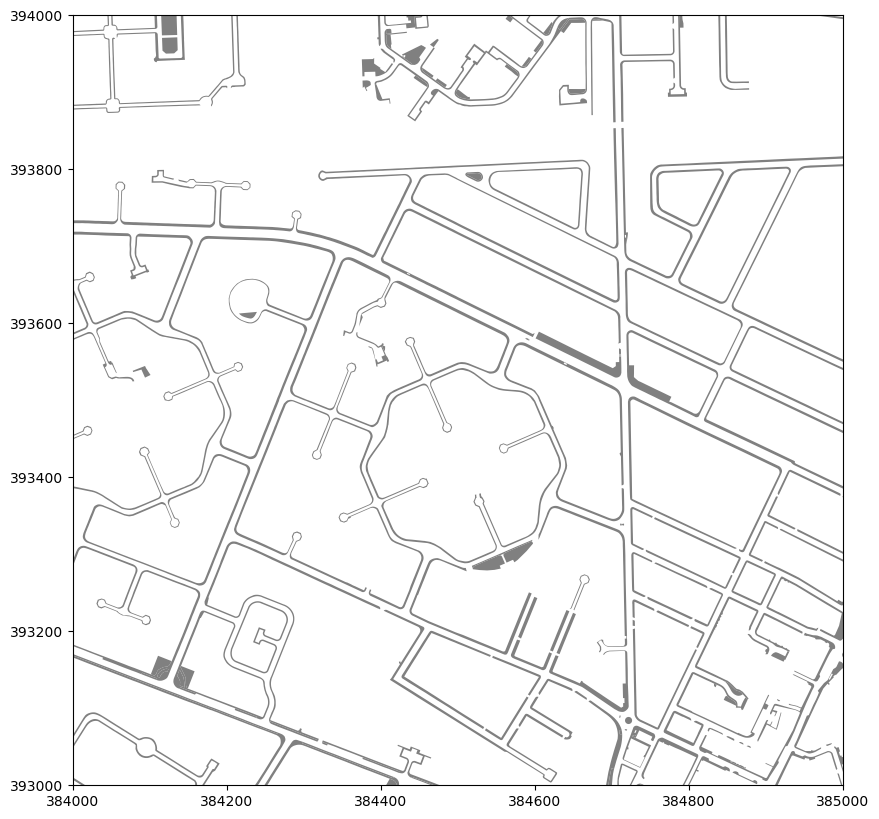

In [21]:
base = M20_rs.plot(figsize = (10,10), color = 'grey')
base.set_xlim(xmin = 384000, xmax = 385000)
base.set_ylim(ymin = 393000, ymax = 394000)

In [22]:
#Spatial join; inner; intersects
#keep LHS gdf geometries that intersect with RHS geometries
#keep RHS information too, but not the geometries, so rows may increase
join_rs = ( gpd.sjoin(M20_rs[['TOID', 'geometry']]
                    , M20Area_GP[['TOID', 'geometry']]
                    , how = 'inner'
                    ,predicate= 'intersects')
           
           .drop(['index_right'], axis = 'columns')
           .rename({'TOID_left':'rsTOID', 'geometry':'rsGeometry', 'TOID_right':'gdnTOID'}, axis='columns')
           .reset_index(drop=True)
          )
#TOID_left: roadside TOID, geometry: ta_rs geometry, TOID_right: gdn TOID
#set geometry
join_rs = join_rs.set_geometry('rsGeometry')

In [23]:
#join_rs.head()
# join_rs.rsGeometry.geom_type.unique()
join_rs.shape

(2665, 3)

In [24]:
M20Area_GP.shape

(3838, 31)

In [25]:
M20Area_GP.TOID.nunique()

3838

In [26]:
#there are 3838 garden TOIDs, so 1173 duplicates, find them
v = join_rs.gdnTOID.value_counts() #create value counts of specified column values
join_rs[join_rs.gdnTOID.isin(v.index[v.gt(1)])] #use v to subset for greater than (gt) n. (less than: lt)

,rsTOID,rsGeometry,gdnTOID
126,osgb1000000253948503,"POLYGON ((384707.100 393699.000, 384706.650 39...",osgb1000000254196410
127,osgb5000005277027701,"POLYGON ((384140.546 393777.043, 384131.832 39...",osgb1000000254196410
250,osgb1000000253955612,"POLYGON ((384016.800 393310.450, 384022.400 39...",osgb1000000254202753
251,osgb1000000254202943,"POLYGON ((384101.100 393144.100, 384106.425 39...",osgb1000000254202753
255,osgb1000000253955612,"POLYGON ((384016.800 393310.450, 384022.400 39...",osgb1000000254202431
...,...,...,...
2588,osgb5000005251928034,"POLYGON ((384690.900 393995.350, 384693.000 39...",osgb1000000254190346
2589,osgb5000005137607818,"POLYGON ((384678.900 393992.950, 384674.800 39...",osgb1000000254190612
2590,osgb5000005251928034,"POLYGON ((384690.900 393995.350, 384693.000 39...",osgb1000000254190612
2591,osgb5000005184384078,"POLYGON ((384405.140 393565.460, 384404.426 39...",osgb5000005124069634


### Gardens with more than one roadside polygon
### 
Three garden polygons shown in shades of green below, that all intersect with the two roadside polygons shown in grey and black.

<Axes: >

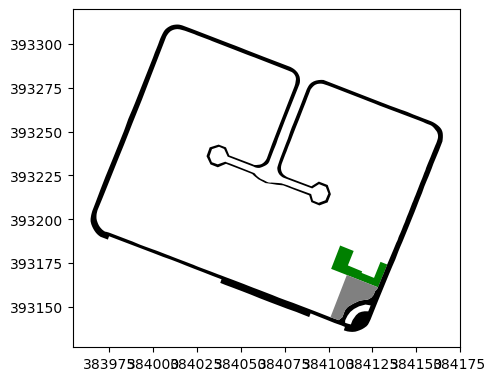

In [27]:
base = M20Area_GP.query("TOID == 'osgb1000000254202753'").plot(figsize=(5,5),color='green')
#gdn.query("TOID == '1000001778714252'").plot(ax = base, color='#00CC00')
#gdn.query("TOID == '1000001778842952'").plot(ax = base, color='#008080')
M20_rs.query("TOID == 'osgb1000000253955612'").plot(ax = base, color='black')
M20_rs.query("TOID == 'osgb1000000254202943'").plot(ax = base, color='grey')
#so these are instances of a single garden TOID touching more than one roadside TOID
#DISSOLVE these roadside polys into one? maybe - drop for now
#the top garen here is uspect - looks like a block of flats surrounded by shared garden

In [28]:
join_rs = join_rs[join_rs.gdnTOID.isin(v.index[v.eq(1)])]

In [29]:
join_rs.nunique()

rsTOID         111
rsGeometry     111
gdnTOID       2475
dtype: int64

In [30]:
join_rs.sort_values(by='gdnTOID')

,rsTOID,rsGeometry,gdnTOID
2492,osgb5000005107990281,"POLYGON ((384407.892 393227.545, 384437.439 39...",osgb1000000254165409
2494,osgb5000005107990281,"POLYGON ((384407.892 393227.545, 384437.439 39...",osgb1000000254165423
399,osgb1000000254166276,"POLYGON ((384938.120 393041.010, 384947.220 39...",osgb1000000254165504
355,osgb1000000254165582,"POLYGON ((384692.030 393096.130, 384692.350 39...",osgb1000000254165546
350,osgb1000000254165582,"POLYGON ((384692.030 393096.130, 384692.350 39...",osgb1000000254165569
...,...,...,...
1974,osgb1000000254518432,"POLYGON ((384994.850 393160.950, 384995.250 39...",osgb5000005290608638
1973,osgb1000000254518432,"POLYGON ((384994.850 393160.950, 384995.250 39...",osgb5000005290608639
211,osgb1000000253948516,"POLYGON ((384106.250 393590.050, 384108.450 39...",osgb5000005293006122
548,osgb1000000254189931,"POLYGON ((384717.900 393614.400, 384717.750 39...",osgb5000005293228288


In [31]:
#create list of simple garden toids - gardens that intersect with only 1 roadside
simple_gdn_list = join_rs['gdnTOID'].drop_duplicates().tolist()

M20Area_GP = (
    M20Area_GP[M20Area_GP['TOID']
    .isin(simple_gdn_list)]
    .drop_duplicates()
    .reset_index(drop = True)
)

In [32]:
M20Area_GP.shape

(2475, 31)

In [33]:
rs = (join_rs.copy(deep = True)
      .drop(['gdnTOID'], axis = 1)
      .drop_duplicates()
      .reset_index(drop = True)     
     )

In [34]:
rs.shape

(111, 2)

In [35]:
join_rs.rsTOID.nunique() == rs.shape[0] #59

True

## Collect roadside linestrings per garden

Just need the gdf of unique roadside polygons that intersect with gardens (111), and the gdf of unique garden polygons that intersect with roadside polygons (2475).

In [36]:
rsEdge = gpd.overlay(M20Area_GP, rs, how = 'intersection', keep_geom_type=False)

In [37]:
rsEdge.shape

(2475, 32)

In [38]:
rsEdge['geometry'].geom_type.value_counts()

MultiLineString       1234
LineString            1222
Point                   14
GeometryCollection       4
MultiPoint               1
Name: count, dtype: int64

In [39]:
rsEdge.head()

,OBJECTID,TOID,FeatureCod,Version,VersionDat,Theme,ThemeCount,Calculated,ChangeDate,ReasonForC,ChangeHist,Descriptiv,Descript_1,Descript_2,Descript_3,Make,PhysicalLe,PhysicalPr,style_code,BHATopoAre,BHAProcess,AbsHMin,AbsH2,AbsHMax,RelH2,RelHMax,BHAConf,Shape_Leng,Shape_Area,condition_,rsTOID,geometry
0,21580938,osgb1000000254165409,10053,3,2006/02/17 00:00:00.000,Land,1,285.789952,2000/10/20 00:00:00.000,New,1,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.828389,285.790000,1,osgb5000005107990281,"LINESTRING (384603.050 393018.500, 384610.500 ..."
1,21580950,osgb1000000254165423,10053,3,2014/04/23 00:00:00.000,Land,1,61.618750,2014/02/20 00:00:00.000,Modified,2,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.681851,61.618750,1,osgb5000005107990281,"MULTILINESTRING ((384610.500 393013.800, 38461..."
2,21581295,osgb1000000254165880,10053,5,2014/04/23 00:00:00.000,Land,1,61.609750,2014/02/20 00:00:00.000,Modified,4,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.593156,61.609750,1,osgb5000005107990281,"LINESTRING (384622.100 393004.650, 384625.450 ..."
3,21581669,osgb1000000254166360,10053,4,2014/04/23 00:00:00.000,Land,1,285.421264,2014/02/20 00:00:00.000,Restructured,2,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.099706,285.421250,1,osgb5000005107990281,"LINESTRING (384574.350 393036.400, 384581.900 ..."
4,21581670,osgb1000000254166361,10053,4,2019/08/30 00:00:00.000,Land,1,260.452480,2019/08/30 00:00:00.000,Restructured,2,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,105.050027,260.452932,1,osgb5000005107990281,"LINESTRING (384581.900 393031.700, 384588.900 ..."


<Axes: >

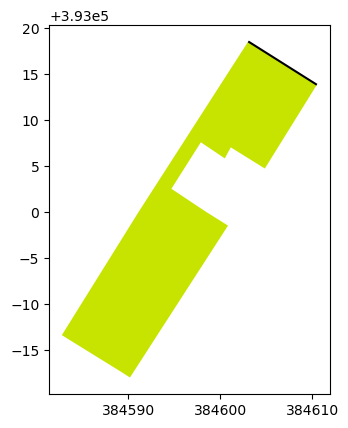

In [40]:
base = rsEdge.query("index == 0").plot(color = 'Black')
M20Area_GP.query("TOID == 'osgb1000000254165409'").plot(ax = base, color = '#C6E400')

#rsEdge.query("index == 3").plot(ax = base, color = 'black')
#gdn.query("TOID == '1000001778708317'").plot(ax = base, color = '#369400')

<Axes: >

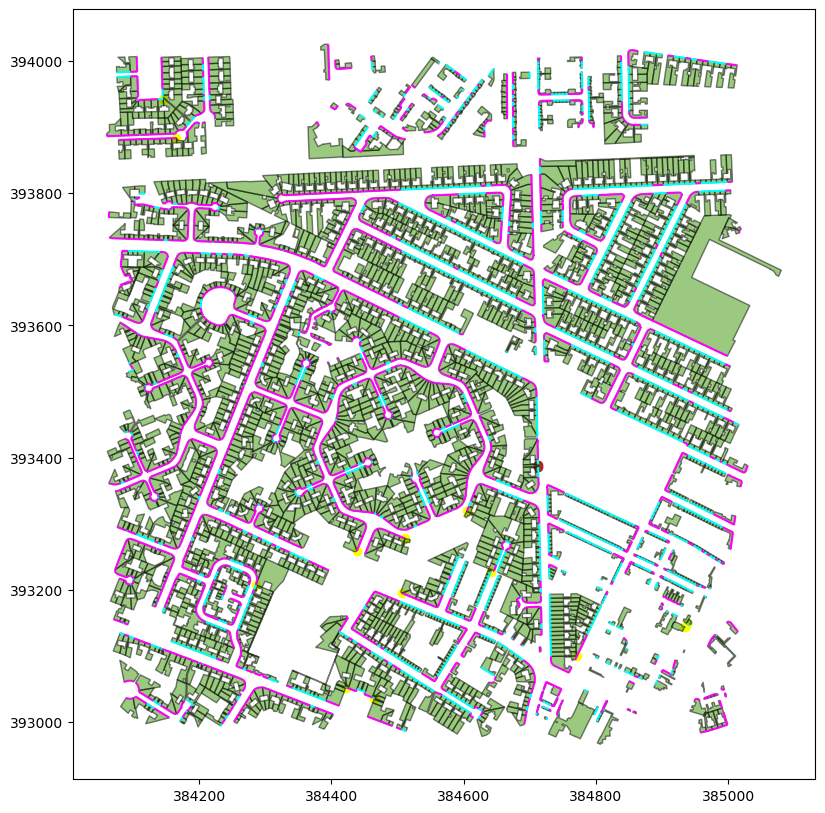

In [41]:
#MultiLineString edges in magenta
base = (   rsEdge[rsEdge['geometry'].geom_type == 'MultiLineString']
    .reset_index(drop = True)
    .plot(figsize = (10,10), color = 'magenta'))
#LineSting edges in cyan
(   rsEdge[rsEdge['geometry'].geom_type == 'LineString']
    .reset_index(drop = True)
    .plot(ax = base, color = 'cyan'))
#a Point in yellow
(   rsEdge[rsEdge['geometry'].geom_type == 'Point']
    .reset_index(drop = True)
    .plot(ax = base, color = 'yellow'))
#a MultiPoint in brown
(   rsEdge[rsEdge['geometry'].geom_type == 'MultiPoint']
    .reset_index(drop = True)
    .plot(ax = base, color = 'brown'))
#gardens in green with black edges
M20Area_GP.plot(ax = base, color = '#369400', alpha = 0.5, edgecolor = 'black')

In [42]:
#create rs_ls: roaside_linestrings
#drop the multi/point geometries
rs_ls = rsEdge.copy(deep = True)[ ~rsEdge['geometry'].geom_type.isin(['Point', 'MultiPoint']) ]

#use lambda to apply a function to each row of a gdf
rs_ls['geometry'] = ( 
    rs_ls['geometry'].apply(lambda x: linemerge(x) if x.geom_type == 'MultiLineString' else x)
)

In [43]:
rs_ls['geometry'].geom_type.value_counts()

LineString            2434
MultiLineString         22
GeometryCollection       4
Name: count, dtype: int64

<Axes: >

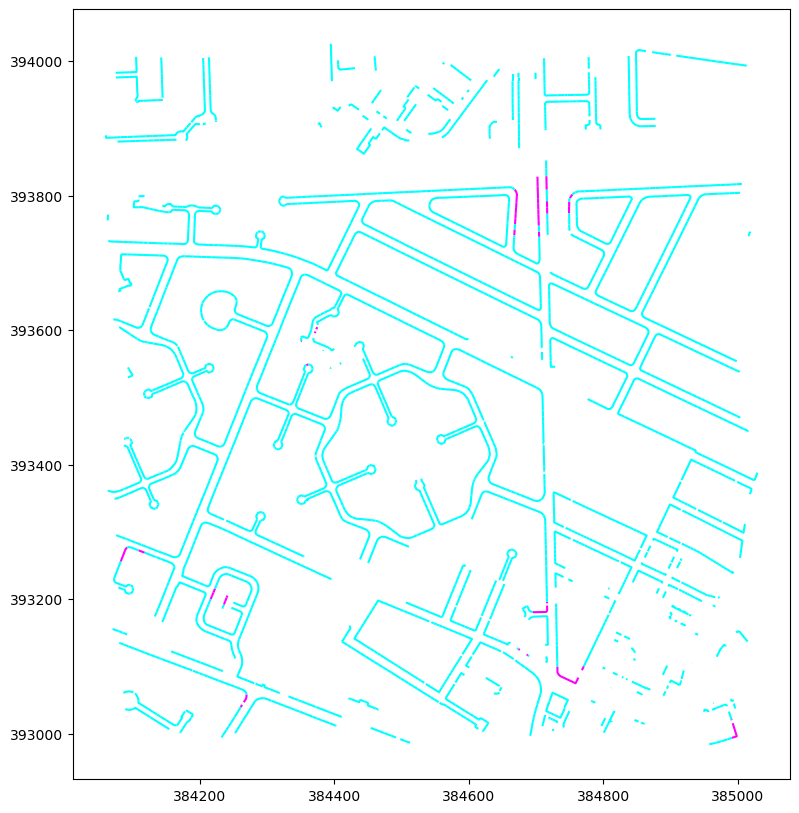

In [44]:
#MultiLineString edges in magenta
base = (   rs_ls[rs_ls['geometry'].geom_type == 'MultiLineString']
    .reset_index(drop = True)
    .plot(figsize = (10,10), color = 'magenta'))
#LineSting edges in cyan
(   rs_ls[rs_ls['geometry'].geom_type == 'LineString']
    .reset_index(drop = True)
    .plot(ax = base, color = 'cyan'))

#base.set_xlim(xmin = 519600, xmax = 519900)
#base.set_ylim(ymin = 180600, ymax = 180900)

In [45]:
#set geometry to non-buffer
#buffer agruments: https://shapely.readthedocs.io/en/latest/manual.html#shapely.geometry.CAP_STYLE
#cap_style 2: flat ends on a shape that has ends (1=round, 3=square)
#join_type 3: bevelled
rs_ls = rs_ls.set_geometry('geometry')
rs_ls['rsBuffGeometry'] = rs_ls.geometry.buffer(distance = 3, cap_style = 2, join_style = 3)
#set geometry to buffer
rs_ls = rs_ls.set_geometry('rsBuffGeometry')
rs_ls['rsBuffGeometry'].geom_type.value_counts()

Polygon         2437
MultiPolygon      23
Name: count, dtype: int64

(393000.0, 393200.0)

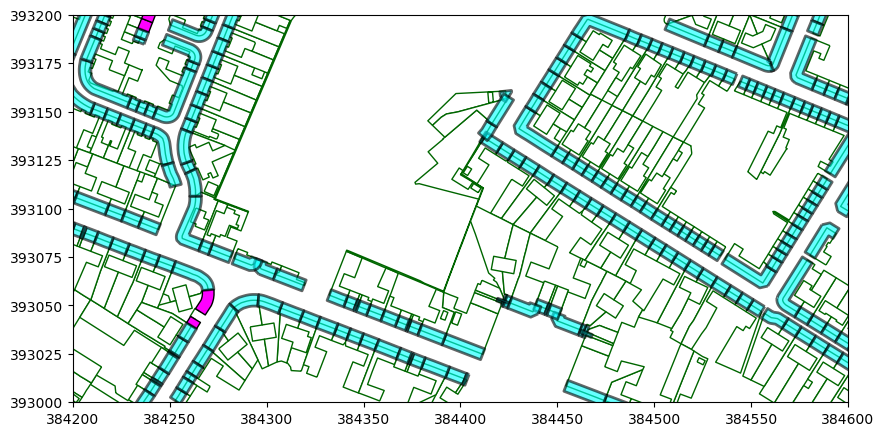

In [46]:
#set geometry to buffer
rs_ls = rs_ls.set_geometry('rsBuffGeometry')

#garden edges
base = M20Area_GP.plot(figsize = (10,10), color = 'white', edgecolor = '#006600')

#MultiLineString edges in magenta
(   rs_ls[rs_ls['rsBuffGeometry'].geom_type == 'MultiPolygon']
    .reset_index(drop = True)
    .plot(ax = base, color = 'magenta', edgecolor = 'black'))
#LineSting edges in cyan
(   rs_ls[rs_ls['rsBuffGeometry'].geom_type == 'Polygon']
    .reset_index(drop = True)
    .plot(ax = base, color = 'cyan', alpha = 0.6, edgecolor = 'black', linewidth = 2))

base.set_xlim(xmin = 384200, xmax = 384600)
base.set_ylim(ymin = 393000, ymax = 393200)

In [47]:
rs_ls.geometry.name

'rsBuffGeometry'

In [48]:
#set geometry
rs_ls = rs_ls.set_geometry('geometry')
rs_ls = rs_ls[ rs_ls['geometry'].geom_type.isin(['LineString']) ]

<Axes: >

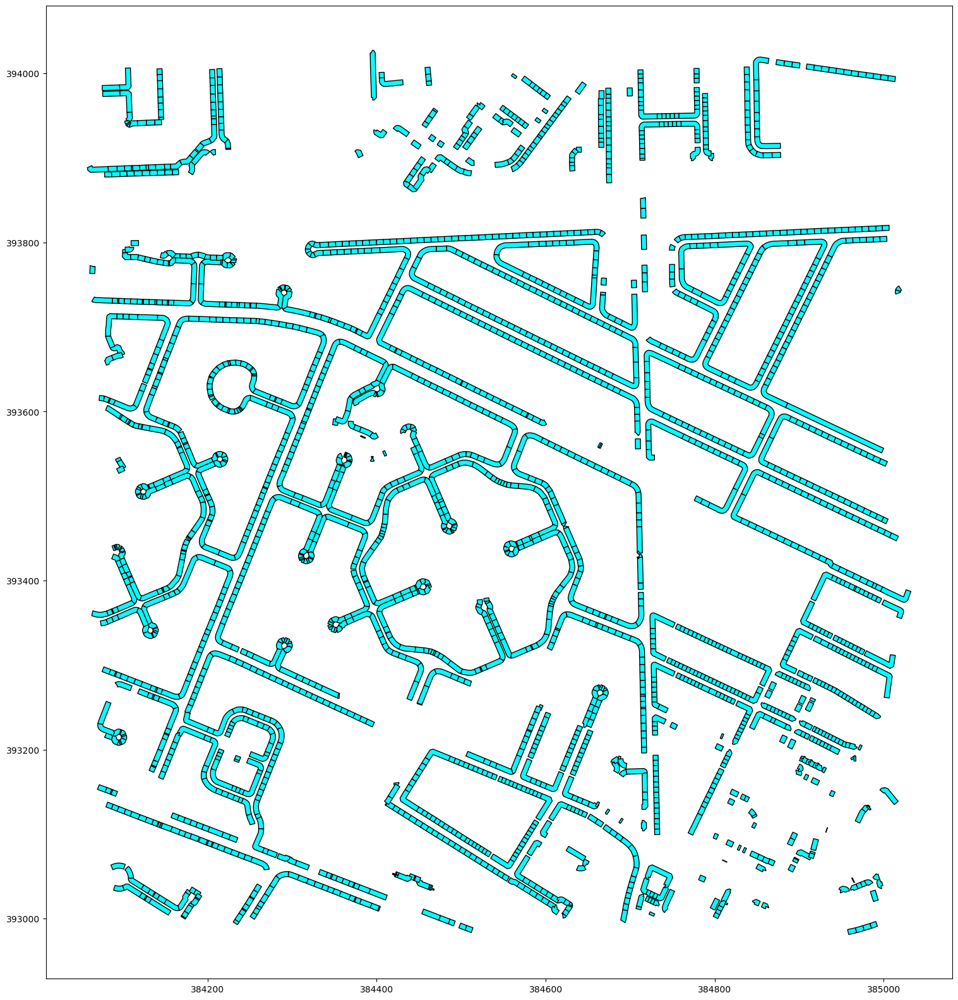

In [49]:
#set geom
rs_ls = rs_ls.set_geometry('rsBuffGeometry')

rs_ls.plot(figsize = (20,20), color = 'cyan', edgecolor = 'black')

In [50]:
#set geometry to LineString geom (geometry) first
rs_ls = rs_ls.set_geometry('geometry')
rs_ls['LineString_length'] = ( 
    rs_ls['geometry'].length
)

In [51]:
rs_ls.head()

,OBJECTID,TOID,FeatureCod,Version,VersionDat,Theme,ThemeCount,Calculated,ChangeDate,ReasonForC,ChangeHist,Descriptiv,Descript_1,Descript_2,Descript_3,Make,PhysicalLe,PhysicalPr,style_code,BHATopoAre,BHAProcess,AbsHMin,AbsH2,AbsHMax,RelH2,RelHMax,BHAConf,Shape_Leng,Shape_Area,condition_,rsTOID,geometry,rsBuffGeometry,LineString_length
0,21580938,osgb1000000254165409,10053,3,2006/02/17 00:00:00.000,Land,1,285.789952,2000/10/20 00:00:00.000,New,1,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.828389,285.790000,1,osgb5000005107990281,"LINESTRING (384603.050 393018.500, 384610.500 ...","POLYGON ((384612.101 393016.337, 384608.899 39...",8.808661
1,21580950,osgb1000000254165423,10053,3,2014/04/23 00:00:00.000,Land,1,61.618750,2014/02/20 00:00:00.000,Modified,2,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.681851,61.618750,1,osgb5000005107990281,"LINESTRING (384610.500 393013.800, 384611.100 ...","POLYGON ((384609.189 393006.969, 384609.136 39...",9.347991
2,21581295,osgb1000000254165880,10053,5,2014/04/23 00:00:00.000,Land,1,61.609750,2014/02/20 00:00:00.000,Modified,4,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.593156,61.609750,1,osgb5000005107990281,"LINESTRING (384622.100 393004.650, 384625.450 ...","POLYGON ((384622.950 393011.358, 384627.950 39...",6.060116
3,21581669,osgb1000000254166360,10053,4,2014/04/23 00:00:00.000,Land,1,285.421264,2014/02/20 00:00:00.000,Restructured,2,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.099706,285.421250,1,osgb5000005107990281,"LINESTRING (384574.350 393036.400, 384581.900 ...","POLYGON ((384583.485 393034.247, 384580.315 39...",8.893396
4,21581670,osgb1000000254166361,10053,4,2019/08/30 00:00:00.000,Land,1,260.452480,2019/08/30 00:00:00.000,Restructured,2,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,105.050027,260.452932,1,osgb5000005107990281,"LINESTRING (384581.900 393031.700, 384588.900 ...","POLYGON ((384590.497 393029.840, 384587.303 39...",8.268011


In [52]:
rs_ls[rs_ls.LineString_length.gt(2)].shape

(2296, 34)

In [84]:
rs_ls.shape

(2434, 34)

In [88]:
roadside_linestrings = (
    rs_ls[['TOID', 'rsTOID', 'geometry']]
    .rename({'TOID':'gdnTOID'}, axis = 'columns')
    .reset_index(drop = True)
)


roadside_linestrings.to_file(r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Roadside\Roadside_Linestring.shp")

In [89]:
roadside_linestrings.head()

,gdnTOID,rsTOID,geometry
0,osgb1000000254165409,osgb5000005107990281,"LINESTRING (384603.050 393018.500, 384610.500 ..."
1,osgb1000000254165423,osgb5000005107990281,"LINESTRING (384610.500 393013.800, 384611.100 ..."
2,osgb1000000254165880,osgb5000005107990281,"LINESTRING (384622.100 393004.650, 384625.450 ..."
3,osgb1000000254166360,osgb5000005107990281,"LINESTRING (384574.350 393036.400, 384581.900 ..."
4,osgb1000000254166361,osgb5000005107990281,"LINESTRING (384581.900 393031.700, 384588.900 ..."


In [54]:
print("Dropping roadside edges less than or equal to 2m in length removes"
      , rs_ls.shape[0] - rs_ls[rs_ls.LineString_length.gt(2)].shape[0]
     , "gardens from the dataframe")

Dropping roadside edges less than or equal to 2m in length removes 138 gardens from the dataframe


In [55]:
roadside_linestrings = (
    rs_ls[['TOID', 'rsTOID', 'geometry']]
    .rename({'TOID':'gdnTOID'}, axis = 'columns')
    .reset_index(drop = True)
)
# roadside_linestrings.head()

## Cropping garden polygons to 9m from roadside
This is to establish portion of garden that would be the "front garden" or "driveway"

In [56]:
#make copy and subset 
rs_buff = rs_ls.copy(deep = True)
#set geometry
rs_buff = rs_buff.set_geometry('geometry')
#keep only those over 2m
rs_buff = rs_buff[rs_buff.LineString_length.gt(2)]
#keep only linestring geometry
rs_buff = rs_buff[['TOID', 'geometry']]
#TOID, is front garden TOID
#geometry is the linestring geom of the roadside edge of the garden

#create Xm buff
rs_buff['rsBuffGeom'] = rs_buff.geometry.buffer(distance = 9, cap_style = 1, join_style = 1)
#drop linestring geom
rs_buff = rs_buff[['TOID', 'rsBuffGeom']]
#set geom
rs_buff = rs_buff.set_geometry('rsBuffGeom', crs = "EPSG:27700")

#sort values by TOID and reset index
rs_buff = rs_buff.sort_values(by = 'TOID').reset_index(drop = True)

rs_buff.head()

,TOID,rsBuffGeom
0,osgb1000000254165409,"POLYGON ((384615.302 393021.412, 384616.025 39..."
1,osgb1000000254165423,"POLYGON ((384601.509 393013.942, 384601.506 39..."
2,osgb1000000254165504,"POLYGON ((384963.582 392976.199, 384959.899 39..."
3,osgb1000000254165546,"POLYGON ((384683.094 393000.409, 384683.173 39..."
4,osgb1000000254165569,"POLYGON ((384502.566 392980.577, 384501.750 39..."


(393000.0, 393200.0)

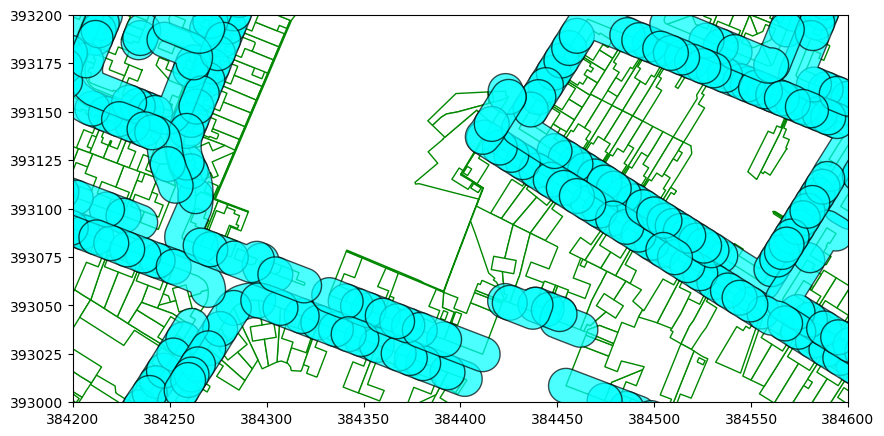

In [57]:
base = M20Area_GP.plot(figsize = (10,10), color = 'white', edgecolor = '#008800')

rs_buff.plot(ax = base, color = 'cyan', alpha = 0.7, edgecolor = 'black')

#rd.plot(ax = base, color = 'brown', alpha = 0.5, edgecolor = 'black')

base.set_xlim(xmin = 384200, xmax = 384600)
base.set_ylim(ymin = 393000, ymax = 393200)

In [58]:
gdn_list = rs_buff['TOID'].drop_duplicates().tolist()
len(gdn_list)


2296

In [59]:
rs_buff_gdn = (
    M20Area_GP[M20Area_GP['TOID']
    .isin(gdn_list)]
    [['TOID', 'geometry']]
    .sort_values(by = 'TOID')
    .drop_duplicates()
    .reset_index(drop = True)
    
)

In [60]:
rs_buff_gdn.nunique()

TOID        2296
geometry    2296
dtype: int64

In [61]:
#check same length
rs_buff.shape[0] == rs_buff_gdn.shape[0]

True

In [62]:
#check TOID ordering is the same
#indexes have been reset so are also equal
( rs_buff[['TOID']] == rs_buff_gdn[['TOID']] ).sum()

TOID    2296
dtype: int64

In [63]:
#this takes about 30 s econds to run!
#create list to hold the results
cropped_gardens = []

#rs_buff and rs_buff_gdn have the same length
for i in np.arange(rs_buff.shape[0]):
    
    #create single row gdf of rs_buff
    gdf1 = rs_buff.iloc[i:i+1]
    #create single row gdf of rs_buff_gdn
    gdf2 = rs_buff_gdn.iloc[i:i+1]
    
    #overlay two single row gdfs
    g = gpd.overlay(gdf1, gdf2, how = 'intersection', keep_geom_type=True)
    
    #store overlay resulting gf in list
    cropped_gardens.append(g);

#use pd.concat to combine gdfs in list to a single gdf
#reset index since every row has index 0
cropped_gardens = pd.concat(cropped_gardens).reset_index(drop=True)

In [64]:
cropped_gardens.head()
#TOID_1 and TOID_2 are both the garden TOID

,TOID_1,TOID_2,geometry
0,osgb1000000254165409,osgb1000000254165409,"POLYGON ((384605.698 393006.188, 384598.248 39..."
1,osgb1000000254165423,osgb1000000254165423,"POLYGON ((384604.118 393003.480, 384604.850 39..."
2,osgb1000000254165504,osgb1000000254165504,"POLYGON ((384959.662 392993.767, 384961.023 39..."
3,osgb1000000254165546,osgb1000000254165546,"POLYGON ((384683.173 393001.086, 384683.364 39..."
4,osgb1000000254165569,osgb1000000254165569,"POLYGON ((384510.747 392996.767, 384509.550 39..."


In [65]:
cropped_gardens.shape

(2296, 3)

(393000.0, 393200.0)

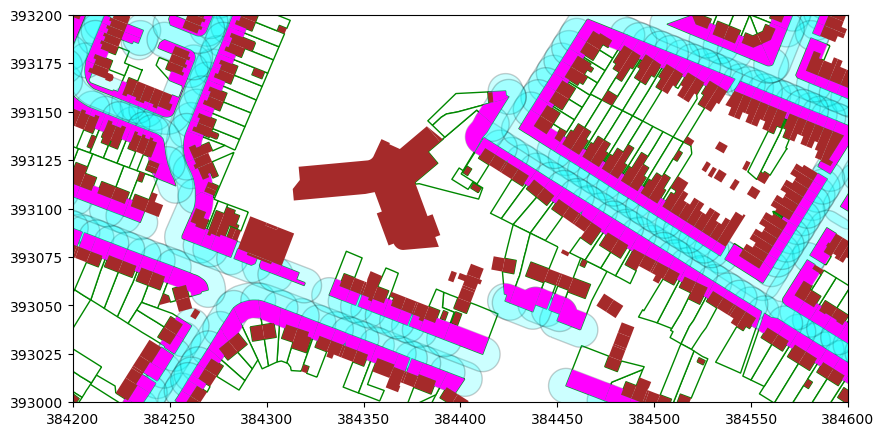

In [66]:
base = rs_buff_gdn.plot(figsize = (10,10), color = 'white', edgecolor = '#008800')

rs_buff.plot(ax = base, color = 'cyan', alpha = 0.2, edgecolor = 'black')

#M20Area.plot(ax = base, color = 'brown', alpha = 0.2, edgecolor = 'black')
M20Area.query("Theme == 'Buildings'").plot(figsize = (20,20), color = "brown", ax = base)

cropped_gardens.plot(ax = base, color = 'magenta')

base.set_xlim(xmin = 384200, xmax = 384600)
base.set_ylim(ymin = 393000, ymax = 393200)

In [67]:
cropped_gardens = (
    cropped_gardens.drop(['TOID_2'], axis=1)
    .rename({'TOID_1':'gdnTOID'}, axis = 'columns')
    .reset_index(drop = True)
)

In [83]:
cropped_gardens.to_file(r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\CroppedGarden\M20CroppedGardens.shp")

In [68]:
cropped_gardens.head()

,gdnTOID,geometry
0,osgb1000000254165409,"POLYGON ((384605.698 393006.188, 384598.248 39..."
1,osgb1000000254165423,"POLYGON ((384604.118 393003.480, 384604.850 39..."
2,osgb1000000254165504,"POLYGON ((384959.662 392993.767, 384961.023 39..."
3,osgb1000000254165546,"POLYGON ((384683.173 393001.086, 384683.364 39..."
4,osgb1000000254165569,"POLYGON ((384510.747 392996.767, 384509.550 39..."


<Axes: >

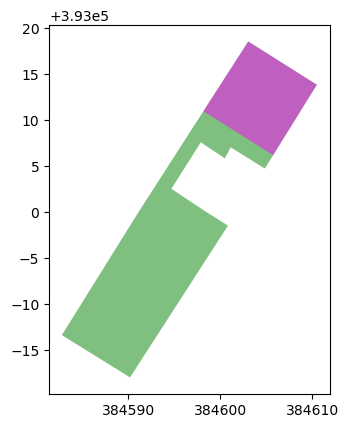

In [69]:
#garden pre-crop
base = M20Area_GP.query("TOID == 'osgb1000000254165409'").plot(color = 'green', alpha = 0.5)
#post-crop
cropped_gardens.query("gdnTOID == 'osgb1000000254165409'").plot(ax = base, color = 'magenta', alpha = 0.5)

In [70]:
cg = cropped_gardens

<Axes: >

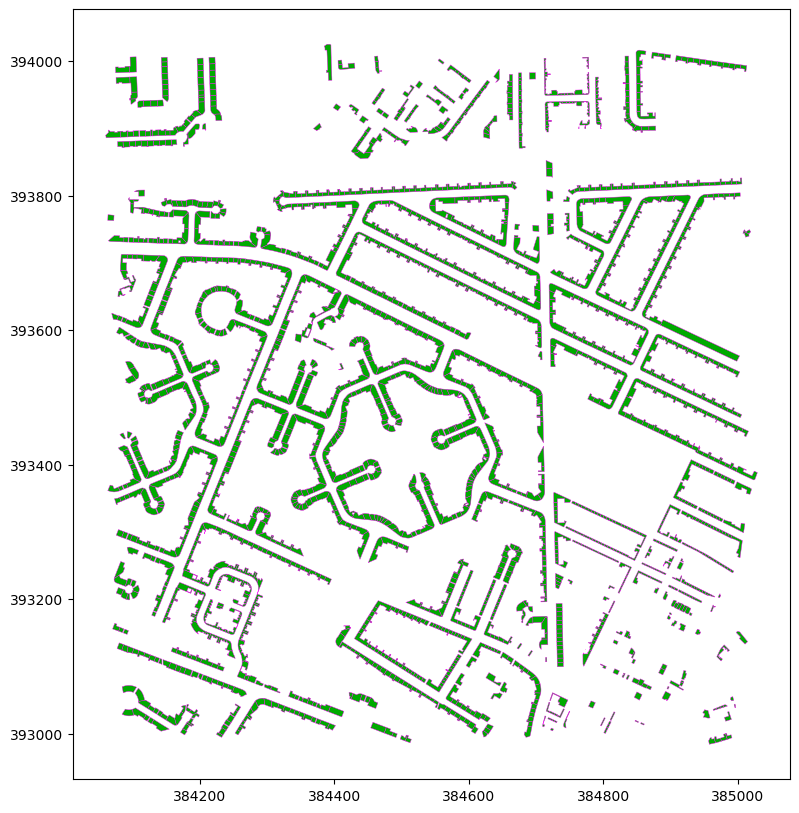

In [71]:
cg.plot(figsize = (10,10), color = '#00AA00', edgecolor = 'magenta', linewidth = 0.3)

<Axes: >

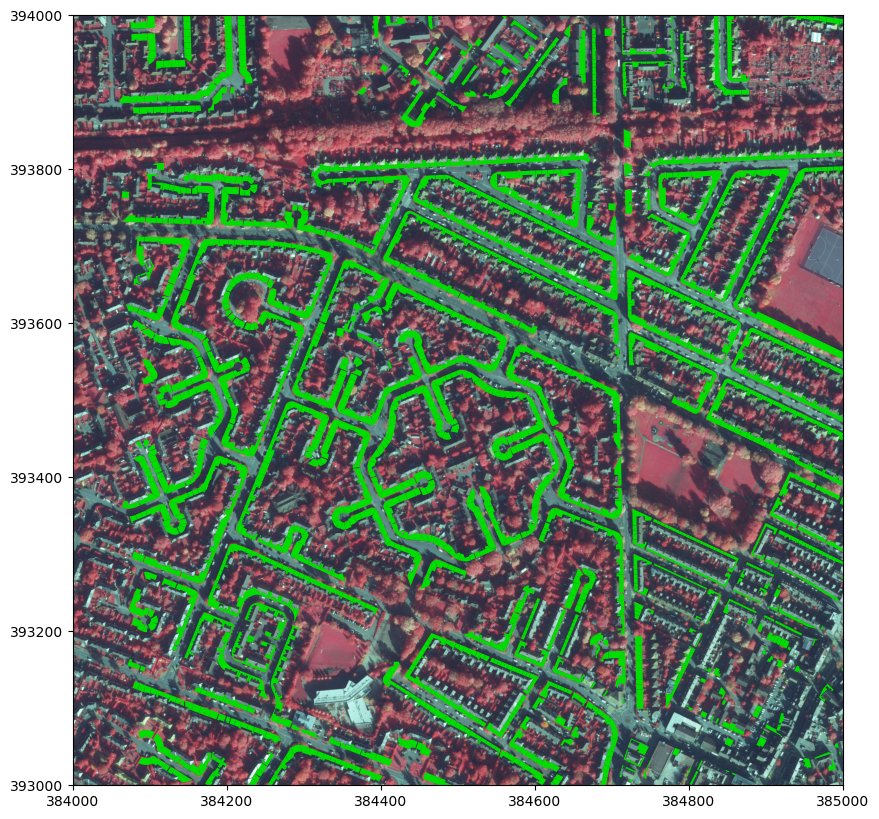

In [72]:
base = cg.plot(figsize=(10,10), color = '#00DD00')
plot.show(nir, ax = base) #uses rasterio plot module

<Axes: >

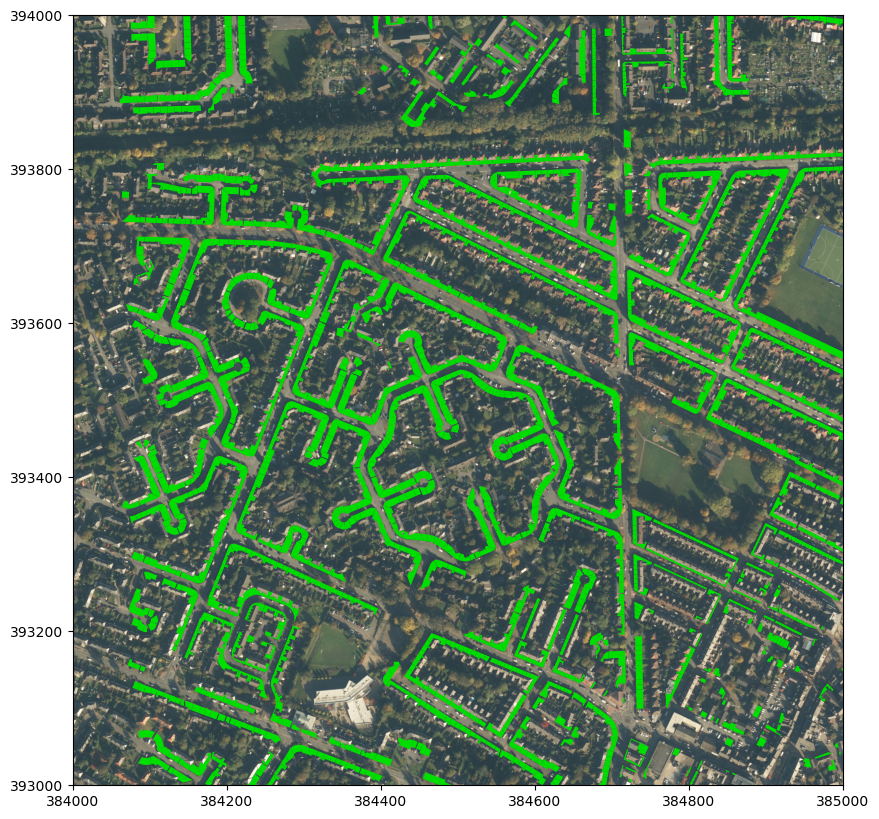

In [73]:
base = cg.plot(figsize=(10,10), color = '#00DD00')
plot.show(rgb, ax = base) #uses rasterio plot module

In [74]:
def jigsaw(raster, gdf, folder_path, grid, toid_col_name = 'TOID'):
    
    #set meta data
    im_meta = raster.meta
    
    for i in np.arange(gdf.shape[0]):
        
        g = gdf.copy(deep=True).iloc[i:i+1] #create single row gdf from gdf
        
        #try to run the mask on the shapes. Somehow some shapes may not be in the grid
        #so have built a pass to do nothing if this happens
        try:
            #use rasterio.mask.mask from rasterio.mask import mask must be run
            #im: raster np array, im_transform: transform 
            im, im_transform = mask(dataset = raster
                                    , shapes = g.geometry #assumes geometry column is named geometry
                                    , crop = True #crop to North and East extent of image
                                    , all_touched = True #include a pixel if it touches any of the shapes
                                    , nodata = 255 #set nodata value for all RGB layers, 255 = white, 0 = black
                                    , filled = True 
                                   )
        
            #update meta data
            im_meta.update({"driver": "GTiff"
                            , "height": im.shape[1]
                            ,"width": im.shape[2]
                            ,"transform": im_transform})
        
            #create filename
            filename = folder_path + "/" + grid + "_" + g[toid_col_name].iloc[0] + ".tif"
        
            #write to tif
            with rasterio.open(filename, mode = "w", **im_meta) as dest:
                dest.write(im)
        
            #plot.show(im)
        
        #if any errors occur in the above just do nothing and move on to the next one
        except:
            pass

"C:\Users\Inateck\Documents\parking_provision\off_street_parking\JigsawCroppedNIR"
"C:\Users\Inateck\Documents\parking_provision\off_street_parking\JigsawCroppedRBG"

## Jigsaw Function on RGB

In [81]:
jigsaw(
    raster = rgb
    , gdf = cg
    , folder_path = r'C:\Users\Inateck\Documents\parking_provision\off_street_parking\JigsawCroppedRGB'
    , grid = "M20"
    , toid_col_name = 'gdnTOID'
)

## Jigsaw Function on NIR

In [77]:
jigsaw(
    raster = nir
    , gdf = cg
    , folder_path = r'C:\Users\Inateck\Documents\parking_provision\off_street_parking\JigsawCroppedNIR'
    , grid = "M20"
    , toid_col_name = 'gdnTOID'
)